In [46]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import preprocessing
from sklearn.metrics import make_scorer, balanced_accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import balanced_accuracy_score, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import balanced_accuracy_score, roc_curve, auc

warnings.filterwarnings('ignore')

In [39]:
df = pd.read_csv('datasets/fetal_health.csv')
df.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [23]:
df.shape

(2126, 22)

In [24]:
#check for missing values
missing_values = df.isnull().sum()
print("Missing values in each column:\n", missing_values)


Missing values in each column:
 baseline value                                            0
accelerations                                             0
fetal_movement                                            0
uterine_contractions                                      0
light_decelerations                                       0
severe_decelerations                                      0
prolongued_decelerations                                  0
abnormal_short_term_variability                           0
mean_value_of_short_term_variability                      0
percentage_of_time_with_abnormal_long_term_variability    0
mean_value_of_long_term_variability                       0
histogram_width                                           0
histogram_min                                             0
histogram_max                                             0
histogram_number_of_peaks                                 0
histogram_number_of_zeroes                                0
histogra


1. Import the dataset using Pandas. Does it have missings?
- the dataset has no missing values as from the above chunk we can see the zeros in all the columns

In [25]:
#check the data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

In [26]:
#check the columns 
df.columns

Index(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability', 'histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency',
       'fetal_health'],
      dtype='object')

2. Our objective will be to distinguish subjects with normal fetal status from the rest. What should
we do in the data set.
- Since the goal is to distinguish subjects with normal fetal status from the rest, we'll create a binary classification problem

In [27]:
df['fetal_health'].unique()

array([2., 1., 3.])

In [28]:
import plotly.express as px

# Define the colors
#colors = ["#f7b2b0", "#8f7198", "#003f5c"]

# Create a pie chart
fig = px.pie(
    df, 
    names="fetal_health", 
    color="fetal_health",
    #color_discrete_sequence=colors,
    title="Distribution of Fetal Health Classes"
)

# Display the plot
fig.show()


<Axes: >

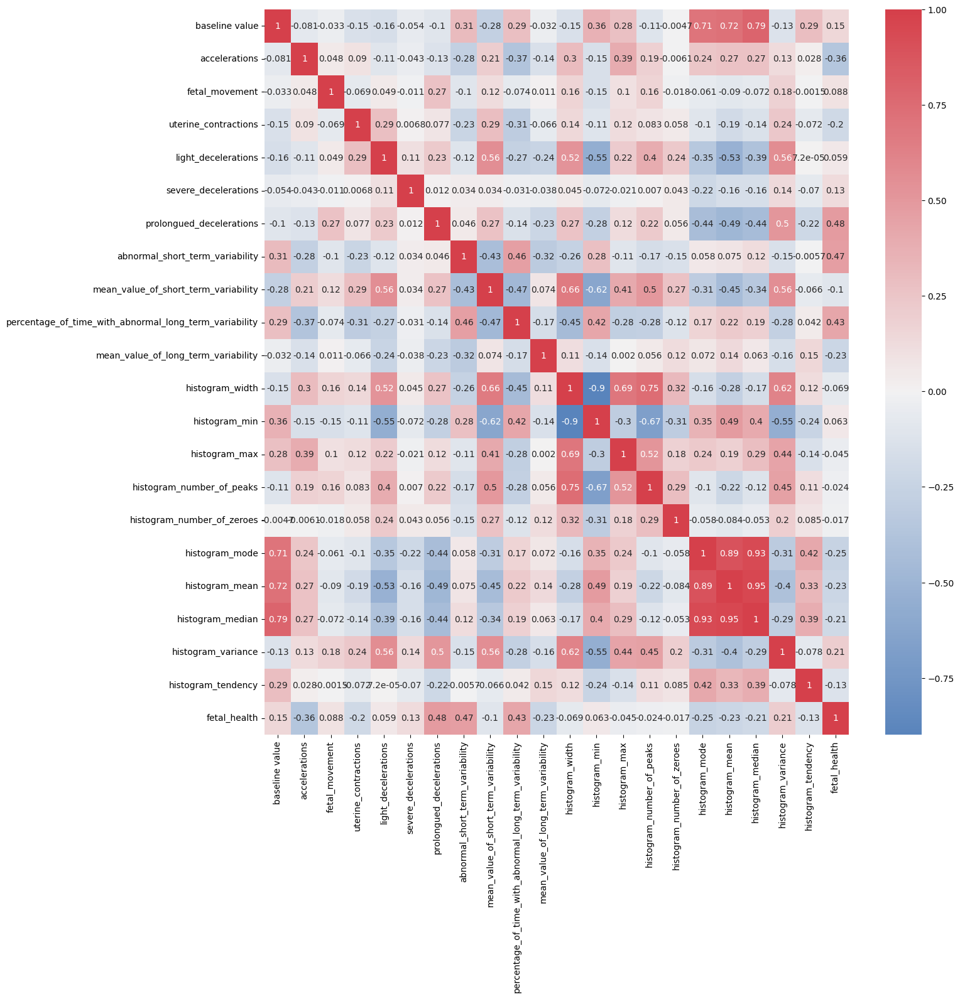

In [29]:
#correlation matrix
corrmat= df.corr()
plt.figure(figsize=(15,15))  

cmap = sns.diverging_palette(250, 10, s=70, l=50, n=10, as_cmap=True)

sns.heatmap(corrmat,annot=True, cmap=cmap, center=0)

In [30]:
cols = df.columns

In [31]:
colors = [
    "#f7b2b0",  # A soft, warm pink
    "#8f7198",  # A muted, deep purple
    "#003f5c",  # A dark, rich blue

    "#ffa600",  # A vibrant, warm orange
    "#bc5090",  # A bright, rich magenta
    "#58508d",  # A cool, dark violet
    "#ff6361",  # A vivid, soft red
    "#7a5195",  # A muted, deep lavender
    "#ffa69e",  # A light, warm coral
    "#2a9d8f",  # A cool, teal green
    "#264653",  # A deep, muted greenish-blue
    "#e9c46a",  # A warm, soft mustard yellow
    "#f4a261",  # A warm, earthy orange
    "#e76f51",  # A vibrant, reddish-orange
    "#4ecdc4",  # A bright, fresh turquoise
    "#ff9f1c",  # A bold, golden yellow
    "#2b2d42",  # A dark, muted navy
    "#edf2f4",  # A very light, soft grayish-white
    "#ef233c",  # A vivid, rich red
    "#d90429",  # A deep, dark crimson
]


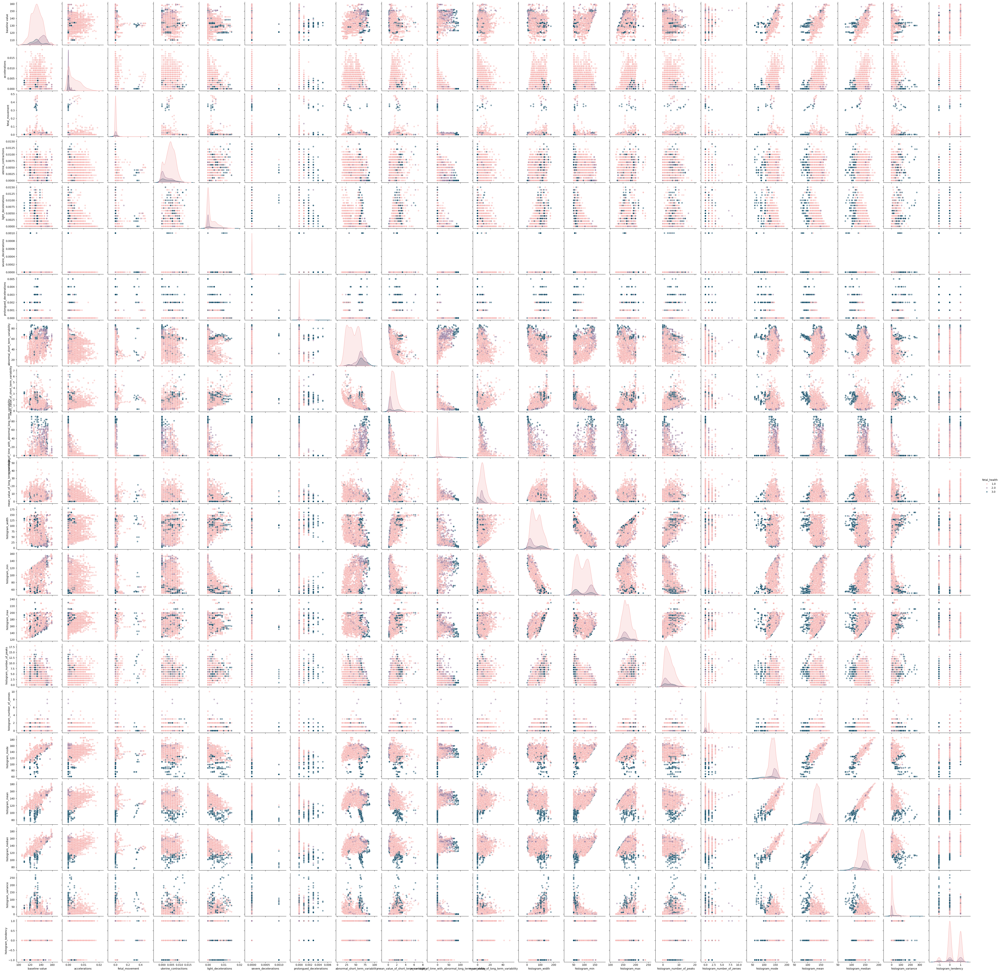

In [32]:

# Create a pairplot with color coding based on the 'fetal_health' column
sns.pairplot(df, hue="fetal_health", palette=colors, plot_kws={'alpha':0.5})

# Show the plot
plt.show()


4. Is this an unbalanced problem?


In [33]:
class_distribution = df['fetal_health'].value_counts()
print("Class distribution:\n", class_distribution)


Class distribution:
 fetal_health
1.0    1655
2.0     295
3.0     176
Name: count, dtype: int64


- This is an Imbalanced data as the values for the fetal health are different.

5. Apply normalization on the dataframe if necessary and divide the available examples into 80%
for training and 20% for testing, randomly. What code have you applied?


In [34]:
#assigning values to features as X and target as y
X=df.drop(["fetal_health"],axis=1)
y=df["fetal_health"]

#Set up a standard scaler for the features
col_names = list(X.columns)
s_scaler = preprocessing.StandardScaler()
X_df= s_scaler.fit_transform(X)
X_df = pd.DataFrame(X_df, columns=col_names)   
X_df.describe().T

,count,mean,std,min,25%,50%,75%,max
baseline value,2126.0,1.069490e-15,1.000235,-2.775197,-0.742373,-0.030884,0.680604,2.713428
accelerations,2126.0,-4.010589e-17,1.000235,-0.822388,-0.822388,-0.304881,0.730133,4.093929
fetal_movement,2126.0,-1.336863e-17,1.000235,-0.203210,-0.203210,-0.203210,-0.138908,10.106540
uterine_contractions,2126.0,-1.336863e-16,1.000235,-1.482465,-0.803434,-0.124404,0.894142,3.610264
light_decelerations,2126.0,-5.347452e-17,1.000235,-0.638438,-0.638438,-0.638438,0.375243,4.429965
severe_decelerations,2126.0,6.684315e-18,1.000235,-0.057476,-0.057476,-0.057476,-0.057476,17.398686
prolongued_decelerations,2126.0,1.336863e-17,1.000235,-0.268754,-0.268754,-0.268754,-0.268754,8.208570
abnormal_short_term_variability,2126.0,-7.352747e-17,1.000235,-2.035639,-0.872088,0.116930,0.815060,2.327675
mean_value_of_short_term_variability,2126.0,6.684315e-17,1.000235,-1.282833,-0.716603,-0.150373,0.415857,6.417893
percentage_of_time_with_abnormal_long_term_variability,2126.0,-5.347452e-17,1.000235,-0.535361,-0.535361,-0.535361,0.062707,4.412293


In [35]:
# Splitting the data into 80% training and 20% testing
X_train, X_test, y_train,y_test = train_test_split(X_df,y,test_size=0.2,random_state=42)

# Print the shapes to verify the split
print(f"Training set shape: {X_train.shape}, {y_train.shape}")
print(f"Testing set shape: {X_test.shape}, {y_test.shape}")


Training set shape: (1700, 21), (1700,)
Testing set shape: (426, 21), (426,)


6. Train a Random Forest (RF) model by adjusting the number of trees to 100, 300 and 1000.
Use 5-fold CV and choose the number of trees that obtains the best balanced accuracy.

In [36]:
# Define the number of trees to test
n_trees = [100, 300, 1000]

# Initialize a dictionary to store the results
results = {}

# Define the balanced accuracy scorer
scorer = make_scorer(balanced_accuracy_score)

# Loop over each n_trees value
for n in n_trees:
    # Initialize the Random Forest model with n trees
    rf_model = RandomForestClassifier(n_estimators=n, random_state=42)
    
    # Perform 5-fold cross-validation and compute balanced accuracy
    cv_scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring=scorer)
    
    # Store the mean balanced accuracy for this model
    results[n] = np.mean(cv_scores)
    
    # Print the results for this number of trees
    print(f"Balanced accuracy with {n} trees: {np.mean(cv_scores):.4f}")

# Determine the best number of trees
best_n_trees = max(results, key=results.get)
print(f"\nBest number of trees based on balanced accuracy: {best_n_trees}")


Balanced accuracy with 100 trees: 0.8566
Balanced accuracy with 300 trees: 0.8540
Balanced accuracy with 1000 trees: 0.8591

Best number of trees based on balanced accuracy: 1000


7. Comparing the results obtained with the three models, does it fit with what you expected to
obtain? **Yes**


### Analysis of Results

The results you obtained show that:

- **100 trees**: Balanced accuracy = 0.8566
- **300 trees**:  Balanced accuracy = 0.8540
- **1000 trees**: Balanced accuracy =  0.8591
- **Best number of trees based on balanced accuracy**: 1000 trees

### Interpretation

- **Performance Improvement with Increased Trees**:
   - The model with 1000 trees achieved the highest balanced accuracy, indicating that increasing the number of trees further improved the model’s performance.
   - This suggests that with more trees, the Random Forest model was able to capture more of the complex patterns in the data, leading to slightly better generalization

### Conclusion

- **1000 trees** is the optimal choice for your Random Forest model based on the cross-validation results. It provides the highest balanced accuracy, meaning it best handles the imbalanced nature of your target classes.
The results indicate that the model continues to benefit from additional trees, improving its ability to generalize to unseen data.

8. Now evaluate the chosen model on the test data. What metric value do you get? Does the
model generalize well?

In [37]:
# Initialize the Random Forest model with the best number of trees
best_rf_model = RandomForestClassifier(n_estimators=1000, random_state=42)

# Train the model on the full training set
best_rf_model.fit(X_train, y_train)


RandomForestClassifier(n_estimators=1000, random_state=42)

In [40]:
# Make predictions on the test set
y_pred = best_rf_model.predict(X_test)

# Calculate balanced accuracy on the test set
test_balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print(f"Balanced Accuracy on the Test Set: {test_balanced_accuracy:.4f}")

# Detailed classification report
print(classification_report(y_test, y_pred))


Balanced Accuracy on the Test Set: 0.9095
              precision    recall  f1-score   support

         1.0       0.97      0.98      0.98       333
         2.0       0.91      0.81      0.86        64
         3.0       0.90      0.93      0.92        29

    accuracy                           0.96       426
   macro avg       0.93      0.91      0.92       426
weighted avg       0.95      0.96      0.95       426



- The Random Forest model with 1000 trees demonstrates strong generalization capabilities, achieving high balanced accuracy and robust performance across all classes. The slight variance in performance across classes is typical in real-world datasets, especially when dealing with imbalanced classes, but the overall metrics suggest that the model is well-suited for this task.

- This result indicates that the model can be confidently used for practical applications, where it needs to distinguish between normal, suspect, and pathological fetal health conditions with high reliability.

9. We will now train a Gradient Boosting Trees model using 5-fold CV. We will consider the default
parameters and we will only vary the number of estimators (100 and 200) and the learning rate
(0.01, 0.1 and 1). Which model obtains better balanced accuracy?

In [41]:
# Define the parameters to test
n_estimators_options = [100, 200]
learning_rate_options = [0.01, 0.1, 1.0]


In [42]:
# Initialize a dictionary to store the results
results = {}

# Define the balanced accuracy scorer
scorer = make_scorer(balanced_accuracy_score)

# Loop over each combination of n_estimators and learning_rate
for n_estimators in n_estimators_options:
    for learning_rate in learning_rate_options:
        # Initialize the Gradient Boosting model with the given parameters
        gb_model = GradientBoostingClassifier(n_estimators=n_estimators, learning_rate=learning_rate, random_state=42)
        
        # Perform 5-fold cross-validation and compute balanced accuracy
        cv_scores = cross_val_score(gb_model, X_train, y_train, cv=5, scoring=scorer)
        
        # Store the mean balanced accuracy for this combination of parameters
        results[(n_estimators, learning_rate)] = np.mean(cv_scores)
        
        # Print the results for this combination of parameters
        print(f"Balanced accuracy with {n_estimators} estimators and learning rate {learning_rate}: {np.mean(cv_scores):.4f}")


Balanced accuracy with 100 estimators and learning rate 0.01: 0.8000
Balanced accuracy with 100 estimators and learning rate 0.1: 0.8897
Balanced accuracy with 100 estimators and learning rate 1.0: 0.8744
Balanced accuracy with 200 estimators and learning rate 0.01: 0.8571
Balanced accuracy with 200 estimators and learning rate 0.1: 0.8889
Balanced accuracy with 200 estimators and learning rate 1.0: 0.8729


In [43]:
# Determine the best combination of n_estimators and learning_rate
best_params = max(results, key=results.get)
best_balanced_accuracy = results[best_params]

print(f"\nBest parameters based on balanced accuracy: n_estimators={best_params[0]}, learning_rate={best_params[1]}")
print(f"Best balanced accuracy: {best_balanced_accuracy:.4f}")



Best parameters based on balanced accuracy: n_estimators=100, learning_rate=0.1
Best balanced accuracy: 0.8897


10. Analyze how the results obtained are modified depending on the two parameters tested. Does
it fit with what should be expected?

### Analysis of Results Based on Varying Parameters


#### 1. **Learning Rate and Balanced Accuracy**:
   - **Lower Learning Rate (0.01)**:
     - For both 100 and 200 estimators, the model performed worse with a learning rate of 0.01.
     - Balanced accuracies: 
       - 100 estimators: **0.8000**
       - 200 estimators: **0.8571**
     - **Analysis**: A very low learning rate can lead to underfitting because the model updates slowly and might not fully capture the complexity of the data. This result fits expectations as the model struggles to learn effectively with such a small step size.

   - **Moderate Learning Rate (0.1)**:
     - This learning rate yielded the best balanced accuracy.
     - Balanced accuracies:
       - 100 estimators: **0.8897**
       - 200 estimators: **0.8889**
     - **Analysis**: A learning rate of 0.1 is often a suitable  for many datasets, providing a good balance between the speed of learning and the ability to generalize. The results align with the expectation that a moderate learning rate would allow the model to converge effectively without overshooting the optimal solution.

   - **High Learning Rate (1.0)**:
     - The performance decreased slightly compared to the 0.1 learning rate.
     - Balanced accuracies:
       - 100 estimators: **0.8744**
       - 200 estimators: **0.8729**
     - **Analysis**: A higher learning rate can cause the model to converge too quickly, potentially missing the optimal solution and leading to slight overfitting or instability. The results are consistent with the expectation that while a higher learning rate can accelerate learning, it might also reduce the model's ability to generalize well.

#### 2. **Number of Estimators and Balanced Accuracy**:
   - **100 vs. 200 Estimators**:
     - The results show that increasing the number of estimators from 100 to 200 does not significantly improve balanced accuracy.
     - **Analysis**: In Gradient Boosting, increasing the number of trees generally helps the model to capture more complex patterns, but after a certain point, the benefit diminishes, especially when the learning rate is moderate or high. This aligns with the results, where the balanced accuracy slightly fluctuates but does not drastically improve with more estimators.

### Summary of Observations
- **Best Performance**: The best balanced accuracy (0.8897) was achieved with **100 estimators** and a **learning rate of 0.1**.
- **Expected Behavior**:
  - **Learning Rate**: A lower learning rate tends to underfit, while a moderate rate performs best. A high learning rate can lead to slight overfitting.
  - **Estimators**: More estimators usually help but with diminishing returns, particularly when paired with an appropriate learning rate.

### Conclusion
- A moderate learning rate (0.1) with a sufficient number of estimators (100 or 200) tends to provide the best balance between model complexity and generalization.
- The model performs best with 100 estimators and a learning rate of 0.1, confirming that this setup allows the Gradient Boosting model to effectively capture the underlying patterns in the data without overfitting. 


11. With the best set of parameters selected, evaluate the model on the test data. Does it generalize
well in this case?

In [44]:

# Initialize the Gradient Boosting model with the best parameters
best_gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)

# Train the model on the full training set
best_gb_model.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

In [45]:
# Make predictions on the test set
y_pred = best_gb_model.predict(X_test)

# Calculate balanced accuracy on the test set
test_balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
print(f"Balanced Accuracy on the Test Set: {test_balanced_accuracy:.4f}")

# Generate a detailed classification report
print(classification_report(y_test, y_pred))


Balanced Accuracy on the Test Set: 0.9212
              precision    recall  f1-score   support

         1.0       0.97      0.97      0.97       333
         2.0       0.87      0.83      0.85        64
         3.0       0.90      0.97      0.93        29

    accuracy                           0.95       426
   macro avg       0.91      0.92      0.92       426
weighted avg       0.95      0.95      0.95       426




- **Balanced Accuracy on the Test Set**: 0.9212
- **Precision, Recall, F1-Score**:
  - **Class 1 (Normal)**:
    - Precision: 0.97
    - Recall: 0.97
    - F1-Score: 0.97
  - **Class 2 (Suspect)**:
    - Precision: 0.87
    - Recall: 0.83
    - F1-Score: 0.85
  - **Class 3 (Pathological)**:
    - Precision: 0.90
    - Recall: 0.97
    - F1-Score: 0.93
- **Overall Accuracy**: 0.95
- **Macro Average**:
  - Precision: 0.91
  - Recall: 0.92
  - F1-Score: 0.92
- **Weighted Average**:
  - Precision: 0.95
  - Recall: 0.95
  - F1-Score: 0.95

### Interpretation of Results

1. **Balanced Accuracy**:
   - The balanced accuracy of **0.9212** on the test set is very strong, indicating that the model performs exceptionally well across all classes, even in an imbalanced dataset scenario. This is an improvement over the cross-validation balanced accuracy (0.8897), suggesting that the model generalizes very well to new data.

2. **Precision, Recall, F1-Score**:
   - **Class 1 (Normal)**: The model maintains excellent performance on the normal class, with all metrics (precision, recall, F1-score) being high (0.97). This is expected as the normal class is likely the majority class.
   - **Class 2 (Suspect)**: Performance is good with precision at 0.87 and recall at 0.83. The F1-score of 0.85 indicates that the model is reasonably effective at identifying suspect cases, though there is still some room for improvement in recall.
   - **Class 3 (Pathological)**: The model shows very strong performance on this minority class with a recall of 0.97 and an F1-score of 0.93, indicating it effectively identifies pathological cases.

3. **Overall Accuracy**:
   - An overall accuracy of **0.95** shows that the model correctly classifies the vast majority of instances. Given the imbalanced nature of the data, this high accuracy, along with the balanced accuracy, is an excellent indicator of the model's effectiveness.

4. **Macro and Weighted Averages**:
   - The **macro average** scores (precision: 0.91, recall: 0.92, F1-score: 0.92) indicate that the model performs well across all classes on average, without disproportionately favoring the majority class.
   - The **weighted average** scores (precision: 0.95, recall: 0.95, F1-score: 0.95) show that the model's performance is consistently high across the entire dataset, accounting for class imbalance.

### Does the Model Generalize Well?

- **Generalization**: The high balanced accuracy of 0.9212 on the test set, which is even better than the cross-validation score, indicates that the model generalizes exceptionally well to new, unseen data. This suggests that the model is neither overfitting nor underfitting and is capable of making reliable predictions in real-world scenarios.
- **Class Balance**: The model performs consistently well across all classes, including the minority classes (Classes 2 and 3). This balanced performance across different classes further confirms the model's robustness and its ability to generalize well.

### Conclusion

The Gradient Boosting model with 100 estimators and a learning rate of 0.1 demonstrates excellent generalization capabilities, achieving a high balanced accuracy of 0.9212 on the test set. The model maintains strong performance across all classes, with particularly high precision and recall, making it a reliable choice for practical applications in predicting fetal health status. This strong performance on both the training (cross-validation) and test sets indicates that the model is well-tuned and effectively captures the underlying patterns in the data.

12. Finally, obtain both the ROC curve of the model and the area under the curve. At what point
of the ROC curve would you work if you had to apply it in practice? Justify your answer.

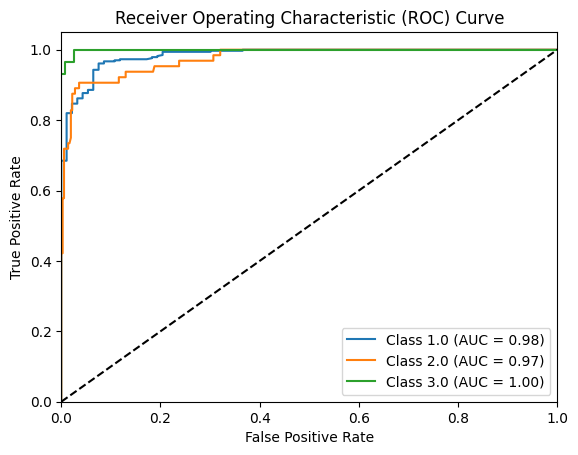

In [47]:
# Compute the probability estimates for each class
y_prob = best_gb_model.predict_proba(X_test)

# Initialize dictionaries to store FPR, TPR, and AUC for each class
fpr = {}
tpr = {}
roc_auc = {}

# Compute ROC curve and AUC for each class
for i in range(len(best_gb_model.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test == best_gb_model.classes_[i], y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curves for each class
plt.figure()
for i in range(len(best_gb_model.classes_)):
    plt.plot(fpr[i], tpr[i], label=f'Class {best_gb_model.classes_[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()




- **Class 1.0 (Normal)**: AUC = 0.98
- **Class 2.0 (Suspect)**: AUC = 0.97
- **Class 3.0 (Pathological)**: AUC = 1.00

1. **AUC Values**:
   - **Class 1 (Normal)**: The AUC of 0.98 indicates excellent performance. The model is very good at distinguishing between normal and non-normal cases.
   - **Class 2 (Suspect)**: An AUC of 0.97 also reflects strong performance, meaning the model effectively discriminates suspect cases from others.
   - **Class 3 (Pathological)**: An AUC of 1.00 suggests perfect discrimination between pathological cases and others, indicating the model is highly effective in identifying this class.

2. **ROC Curve Shape**:
   - All ROC curves are close to the top-left corner of the plot, which is ideal and indicates high sensitivity (True Positive Rate) with low False Positive Rates.
   - Class 3's curve being perfectly aligned with the left axis and top indicates the model is not making any errors in distinguishing pathological cases, which is critical in high-stakes applications like healthcare.


### Practical Consideration

If I were to apply this model in practice,I would likely select an operating point that maximizes the True Positive Rate (sensitivity) while keeping the False Positive Rate at an acceptable level. For instance:

